In [2]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [3]:
import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F
import torch.utils.data

from torchvision.models.inception import inception_v3

import numpy as np
from scipy.stats import entropy

In [4]:
import hw3.inception_score as score

class IgnoreLabelDataset(torch.utils.data.Dataset):
    def __init__(self, orig):
        self.orig = orig

    def __getitem__(self, index):
        return self.orig[index][0]

    def __len__(self):
        return len(self.orig)

import torchvision.datasets as dset
import torchvision.transforms as transforms

cifar = dset.CIFAR10(root='data/', download=True,
                         transform=transforms.Compose([
                             transforms.Scale(32),
                             transforms.ToTensor(),
                             transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                         ])
)

IgnoreLabelDataset(cifar)

print ("Calculating Inception Score...")
print (score.inception_score(IgnoreLabelDataset(cifar), cuda=True, batch_size=32, resize=True, splits=10))

/home/valensidavid/miniconda3/envs/cs236781-hw/lib/python3.8/site-packages/torchvision/transforms/transforms.py:256: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  warnings.warn("The use of the transforms.Scale transform is deprecated, " +


Files already downloaded and verified
Calculating Inception Score...
Number of samples for inception score =  50000


/home/valensidavid/miniconda3/envs/cs236781-hw/lib/python3.8/site-packages/torch/nn/functional.py:3118: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "
/home/valensidavid/deep-learning/Deep_Learning_HW4/project/hw3/inception_score.py:46: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(x).data.cpu().numpy()


(9.672780722701322, 0.14991599396927277)


In [5]:
import cs236781.plot as plot
import cs236781.download

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

File /home/valensidavid/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/valensidavid/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/valensidavid/.pytorch-datasets/lfw/George_W_Bush


In [6]:
ds_gwb_no_label = IgnoreLabelDataset(ds_gwb)
print(len(ds_gwb_no_label))

print ("Calculating Inception Score...")
print (score.inception_score(ds_gwb_no_label, cuda=True, batch_size=32, resize=True, splits=10))

530
Calculating Inception Score...
Number of samples for inception score =  530
(1.750393230600272, 0.2111367214574994)


In [9]:
checkpoint_file_final = 'checkpoints/gan_final_no_optim'

# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file_final}.pt'):
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=900, with_grad=False).cpu()
print(samples.shape)
#fig, _ = plot.tensors_as_images(samples, nrows=20, figsize=(20,30))

*** Images Generated from best model:
torch.Size([900, 3, 64, 64])


In [10]:
print ("Calculating Inception Score...")
print (score.inception_score(samples, cuda=True, batch_size=32, resize=True, splits=10))

Calculating Inception Score...
Number of samples for inception score =  900
(2.0613793351601375, 0.08040614131899251)


In [11]:
import torch.optim as optim
import hw3.gan as gan
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape


# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])


# Loss Wasserstein-GAN
def dsc_loss_fn_wasserstein(y_data, y_generated):
    return gan.discriminator_loss_fn_wasserstein(y_data, y_generated, hp['label_noise'])

def gen_loss_fn_wasserstein(y_generated):
    return gan.generator_loss_fn_wasserstein(y_generated)

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 32, 'z_dim': 256, 'data_label': 1, 'label_noise': 0.3, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}}


In [26]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint


if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

def train_gan(num_epochs, checkpoint_file, sn=False, wasserstein=False):
    try:
        # Model
        dsc = gan.Discriminator(im_size, sn).to(device)
        gen = gan.Generator(z_dim, featuremap_size=4).to(device)
        
        #Optimizer
        #TODO: excluse SN layer parameters
        dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
        gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])
        
        dsc_avg_losses, gen_avg_losses = [], []
        for epoch_idx in range(num_epochs):
            # We'll accumulate batch losses and show an average once per epoch.
            dsc_losses, gen_losses = [], []
            print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

            with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout, position=0, leave=True) as pbar:
                for batch_idx, (x_data, _) in enumerate(dl_train):
                    x_data = x_data.to(device)
                    if wasserstein == False:
                        dsc_loss, gen_loss = train_batch(
                            dsc, gen,
                            dsc_loss_fn, gen_loss_fn,
                            dsc_optimizer, gen_optimizer,
                            x_data)
                    else:
                        dsc_loss, gen_loss = train_batch(
                            dsc, gen,
                            dsc_loss_fn_wasserstein, gen_loss_fn_wasserstein,
                            dsc_optimizer, gen_optimizer,
                            x_data)
                    dsc_losses.append(dsc_loss)
                    gen_losses.append(gen_loss)
                    pbar.update()

            dsc_avg_losses.append(np.mean(dsc_losses))
            gen_avg_losses.append(np.mean(gen_losses))
            print(f'Discriminator loss: {dsc_avg_losses[-1]}')
            print(f'Generator loss:     {gen_avg_losses[-1]}')

            if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
                print(f'Saved checkpoint.')


            samples = gen.sample(5, with_grad=False)
            fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
            IPython.display.display(fig)
            plt.close(fig)
    except KeyboardInterrupt as e:
        print('\n *** Training interrupted by user')

*** Images Generated from best model:
Calculating Inception Score for SNGAN...
Number of samples for inception score =  900
(2.2562851532072243, 0.08672226645925492)


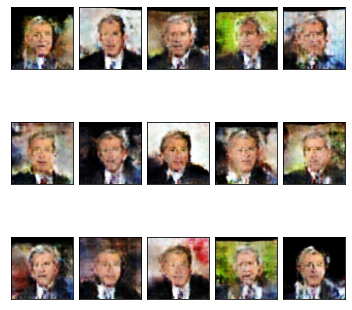

In [13]:
import hw3.inception_score as score

checkpoint_file_final_sn = 'checkpoints/gan_sn'

# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file_final_sn}.pt'):
    gen_sn = torch.load(f'{checkpoint_file_final_sn}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen_sn.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))


samples = gen_sn.sample(n=900, with_grad=False).cpu()
print ("Calculating Inception Score for SNGAN...")
print (score.inception_score(samples, cuda=True, batch_size=32, resize=True, splits=10))

In [28]:
## 1. SN GAN

--- EPOCH 1/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.66it/s]
Discriminator loss: 1.3217008694568102
Generator loss:     8.435249398996616
Saved checkpoint.


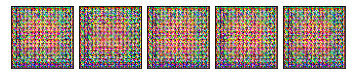

--- EPOCH 2/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: 0.268651824006263
Generator loss:     11.726022776435403


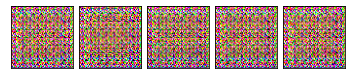

--- EPOCH 3/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: 0.30731865500702576
Generator loss:     20.025323334862204


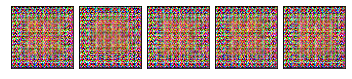

--- EPOCH 4/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: 0.31386850467499566
Generator loss:     20.682837710661047


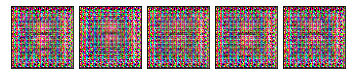

--- EPOCH 5/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: 0.499373799737762
Generator loss:     19.145736441892737


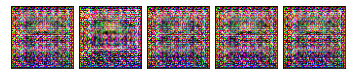

--- EPOCH 6/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.83it/s]
Discriminator loss: 0.19987285268657348
Generator loss:     10.790821047390208
Saved checkpoint.


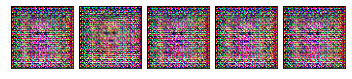

--- EPOCH 7/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.75it/s]
Discriminator loss: 0.17016629304955988
Generator loss:     14.371987763573141


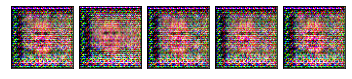

--- EPOCH 8/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
Discriminator loss: 2.103723502772696
Generator loss:     13.553309622932883


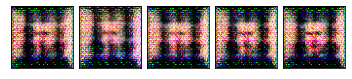

--- EPOCH 9/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: 0.7422188735183548
Generator loss:     8.5273438762216
Saved checkpoint.


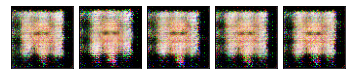

--- EPOCH 10/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.8620305606985793
Generator loss:     10.391856866724352


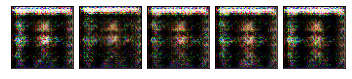

--- EPOCH 11/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: 0.03450408665572896
Generator loss:     6.6883805779849785
Saved checkpoint.


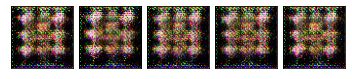

--- EPOCH 12/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: 0.08075975166524157
Generator loss:     8.315626354778514


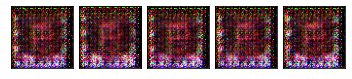

--- EPOCH 13/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
Discriminator loss: -0.007012513192260966
Generator loss:     12.201499658472398


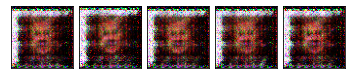

--- EPOCH 14/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: 2.6798825903850445
Generator loss:     12.200055875760668


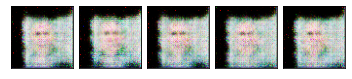

--- EPOCH 15/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.77it/s]
Discriminator loss: 0.29256471980582266
Generator loss:     6.667079041985905
Saved checkpoint.


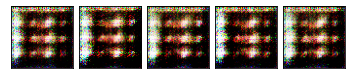

--- EPOCH 16/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.41it/s]
Discriminator loss: 0.13662034448455362
Generator loss:     6.822717021493351


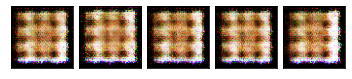

--- EPOCH 17/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.40it/s]
Discriminator loss: 0.384659729021437
Generator loss:     10.418242875267477


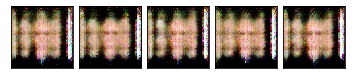

--- EPOCH 18/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: 0.6131476855234188
Generator loss:     9.426745176315308


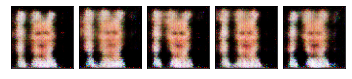

--- EPOCH 19/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: 0.7503515403060352
Generator loss:     8.377341074102064


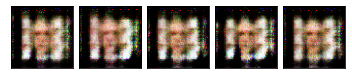

--- EPOCH 20/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: 0.5164865487638641
Generator loss:     7.9721858922173
Saved checkpoint.


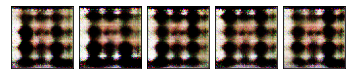

--- EPOCH 21/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: 0.7141548788503689
Generator loss:     7.327709590687471


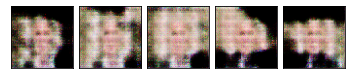

--- EPOCH 22/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.82it/s]
Discriminator loss: 0.8767505533554975
Generator loss:     4.165888148195603


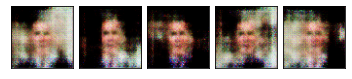

--- EPOCH 23/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.88it/s]
Discriminator loss: 0.8507641159436282
Generator loss:     3.8699664105387295
Saved checkpoint.


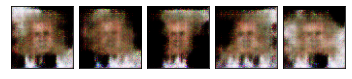

--- EPOCH 24/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.3773203571053112
Generator loss:     3.5754405049716724
Saved checkpoint.


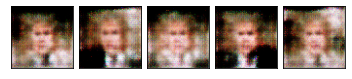

--- EPOCH 25/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: 0.4635237069690929
Generator loss:     3.694194751627305


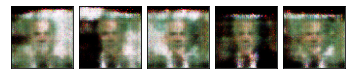

--- EPOCH 26/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: 0.808203642420909
Generator loss:     4.583906468223123


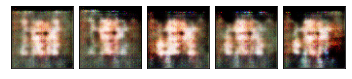

--- EPOCH 27/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: 0.7675585185780245
Generator loss:     4.472059831899755
Saved checkpoint.


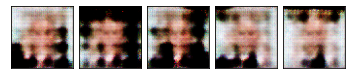

--- EPOCH 28/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.75it/s]
Discriminator loss: 0.7969668095602709
Generator loss:     4.277916578685536


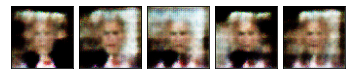

--- EPOCH 29/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.6052663335028816
Generator loss:     3.965310110765345
Saved checkpoint.


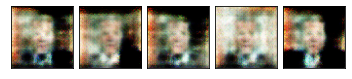

--- EPOCH 30/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
Discriminator loss: 0.4623570775284487
Generator loss:     4.506885135875029


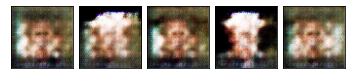

--- EPOCH 31/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.86it/s]
Discriminator loss: 0.8068371314336272
Generator loss:     4.309656451730167


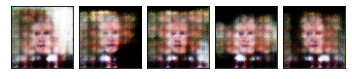

--- EPOCH 32/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.5024348826092833
Generator loss:     4.641631308723898


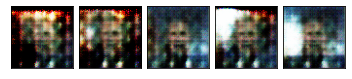

--- EPOCH 33/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.27it/s]
Discriminator loss: 0.9298594111905378
Generator loss:     4.106080195483039


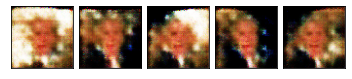

--- EPOCH 34/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
Discriminator loss: 0.43938708425882983
Generator loss:     3.92703573142781
Saved checkpoint.


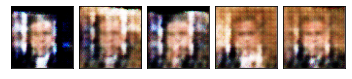

--- EPOCH 35/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: 0.6701400876045227
Generator loss:     4.296868464526008


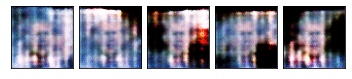

--- EPOCH 36/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: 0.8776167613618514
Generator loss:     4.2493076885447785


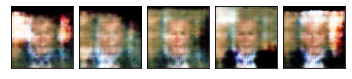

--- EPOCH 37/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.63it/s]
Discriminator loss: 0.41880298975635977
Generator loss:     3.6014267556807575
Saved checkpoint.


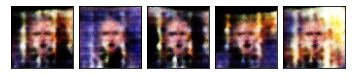

--- EPOCH 38/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: 0.7434638703570646
Generator loss:     4.942235862507539


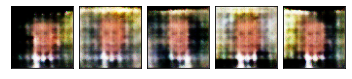

--- EPOCH 39/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.86it/s]
Discriminator loss: 0.6564643847591737
Generator loss:     4.668164155062507
Saved checkpoint.


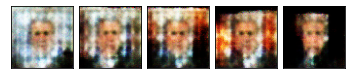

--- EPOCH 40/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.6170578458729912
Generator loss:     3.973266868030324
Saved checkpoint.


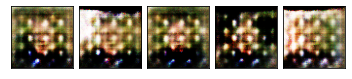

--- EPOCH 41/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: 0.6509850691346561
Generator loss:     4.213823760257048


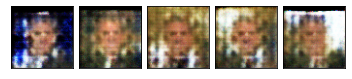

--- EPOCH 42/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.6489601836485022
Generator loss:     4.922572935328764


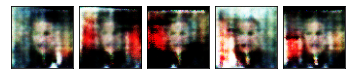

--- EPOCH 43/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.5259217164095711
Generator loss:     4.702065271489761
Saved checkpoint.


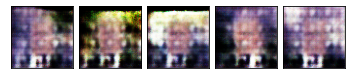

--- EPOCH 44/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: 0.6853672940941418
Generator loss:     5.043814729241764


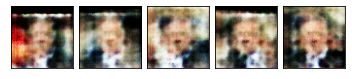

--- EPOCH 45/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.78it/s]
Discriminator loss: 0.7434106986312305
Generator loss:     4.56456976778367


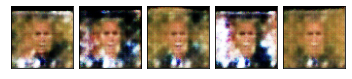

--- EPOCH 46/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.4743152050411
Generator loss:     4.317682154038373
Saved checkpoint.


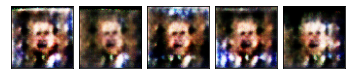

--- EPOCH 47/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: 0.48694819825537067
Generator loss:     5.393059835714452


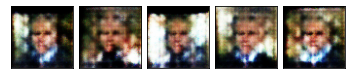

--- EPOCH 48/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: 0.7853182589306551
Generator loss:     4.8771094434401565


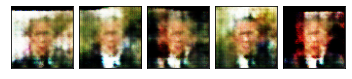

--- EPOCH 49/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: 0.6266230441191617
Generator loss:     4.132909592460184
Saved checkpoint.


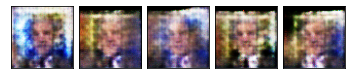

--- EPOCH 50/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: 0.5990364455124911
Generator loss:     4.2176372233559105


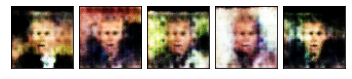

--- EPOCH 51/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
Discriminator loss: 0.437093684778494
Generator loss:     4.091055589563706
Saved checkpoint.


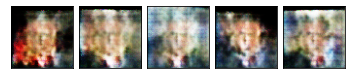

--- EPOCH 52/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.83it/s]
Discriminator loss: 0.7184571071582682
Generator loss:     4.827352523803711


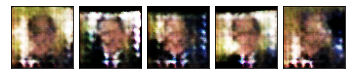

--- EPOCH 53/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: 0.6704864466891569
Generator loss:     4.741226294461419
Saved checkpoint.


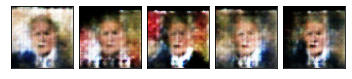

--- EPOCH 54/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.86it/s]
Discriminator loss: 0.6555469881962327
Generator loss:     4.432554287068984
Saved checkpoint.


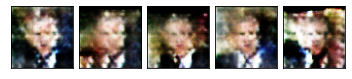

--- EPOCH 55/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: 0.722645557978574
Generator loss:     4.1937475344714


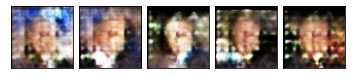

--- EPOCH 56/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.73it/s]
Discriminator loss: 0.46611878626486836
Generator loss:     4.394032590529498


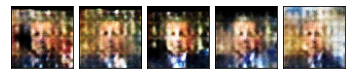

--- EPOCH 57/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: 0.6065607141045963
Generator loss:     4.773070714052985


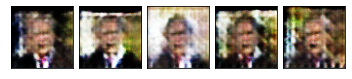

--- EPOCH 58/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: 0.7903947330573026
Generator loss:     4.842503049794366


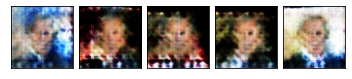

--- EPOCH 59/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.75it/s]
Discriminator loss: 0.6490858495235443
Generator loss:     3.7967523406533634
Saved checkpoint.


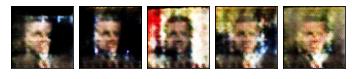

--- EPOCH 60/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.4724680798895219
Generator loss:     4.698705210405238


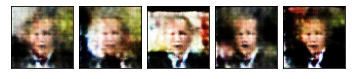

--- EPOCH 61/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: 0.6507611204596127
Generator loss:     4.174409978529987


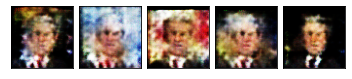

--- EPOCH 62/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.82it/s]
Discriminator loss: 0.5897834362352595
Generator loss:     4.300318591734943


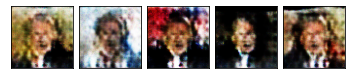

--- EPOCH 63/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: 0.4558141284129199
Generator loss:     4.486908015082864


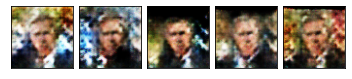

--- EPOCH 64/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.85it/s]
Discriminator loss: 0.5405070921953987
Generator loss:     4.649175643920898


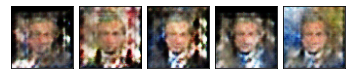

--- EPOCH 65/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: 0.6135264157372362
Generator loss:     4.840517605052275


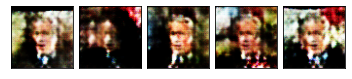

--- EPOCH 66/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
Discriminator loss: 0.47645652403726296
Generator loss:     3.7516463223625633
Saved checkpoint.


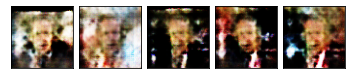

--- EPOCH 67/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.6739765721208909
Generator loss:     4.416081246207742


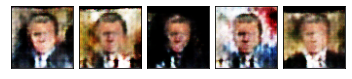

--- EPOCH 68/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
Discriminator loss: 0.3606852525297333
Generator loss:     4.085300515679752
Saved checkpoint.


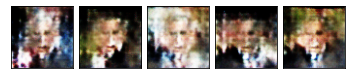

--- EPOCH 69/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.4757465435301556
Generator loss:     4.643925498513615


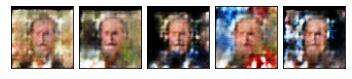

--- EPOCH 70/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: 0.7303746813798652
Generator loss:     5.328828376882217


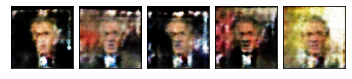

--- EPOCH 71/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: 0.3748236868311377
Generator loss:     3.9090685844421387
Saved checkpoint.


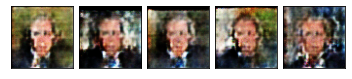

--- EPOCH 72/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: 0.7357164796660928
Generator loss:     5.054067646755891


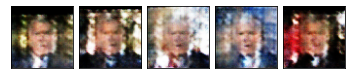

--- EPOCH 73/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: 0.38874972392531004
Generator loss:     4.205293865764842
Saved checkpoint.


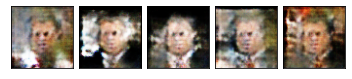

--- EPOCH 74/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
Discriminator loss: 0.5519615999039482
Generator loss:     5.466572873732623


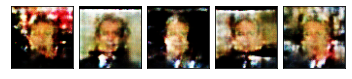

--- EPOCH 75/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.86it/s]
Discriminator loss: 0.42754244278458986
Generator loss:     4.175483605440925
Saved checkpoint.


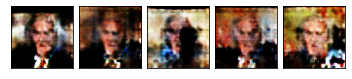

--- EPOCH 76/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: 0.41019175508443045
Generator loss:     4.3684126349056465


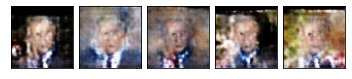

--- EPOCH 77/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.5185233433456982
Generator loss:     4.681007083724527


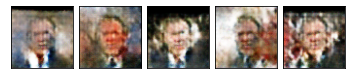

--- EPOCH 78/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.71it/s]
Discriminator loss: 0.4914268483133877
Generator loss:     4.643858026055729
Saved checkpoint.


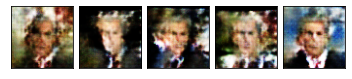

--- EPOCH 79/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.48it/s]
Discriminator loss: 0.34323038555243435
Generator loss:     4.147851088467767
Saved checkpoint.


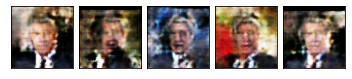

--- EPOCH 80/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: 0.4735209056559731
Generator loss:     5.274123528424432


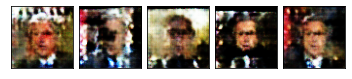

--- EPOCH 81/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.57it/s]
Discriminator loss: 0.48759978987714825
Generator loss:     4.846534294240615


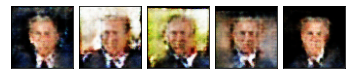

--- EPOCH 82/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: 0.5178980450419819
Generator loss:     4.40738113487468


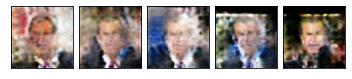

--- EPOCH 83/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.532844709999421
Generator loss:     4.308346495908849


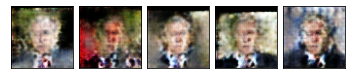

--- EPOCH 84/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: 0.39519837104222355
Generator loss:     4.828310868319343


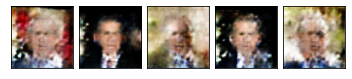

--- EPOCH 85/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.67it/s]
Discriminator loss: 0.3576240033897407
Generator loss:     4.456851776908426
Saved checkpoint.


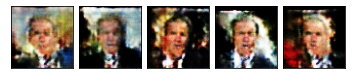

--- EPOCH 86/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: 0.41046496524530296
Generator loss:     4.45360486647662


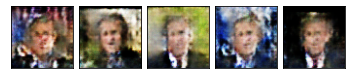

--- EPOCH 87/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.32383935153484344
Generator loss:     4.39574473482721
Saved checkpoint.


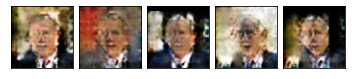

--- EPOCH 88/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.906273430761169
Generator loss:     4.588362595614265


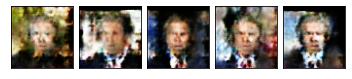

--- EPOCH 89/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: 0.28466973256538897
Generator loss:     3.958628682529225
Saved checkpoint.


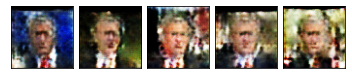

--- EPOCH 90/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: 0.40423624524298835
Generator loss:     4.244182628743789


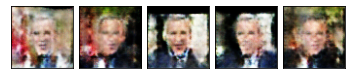

--- EPOCH 91/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: 0.22908124108524883
Generator loss:     4.734566576340619


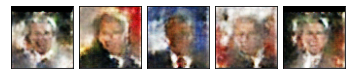

--- EPOCH 92/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.7072217832593357
Generator loss:     4.513669161235585


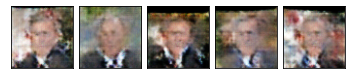

--- EPOCH 93/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: 0.34558518932146187
Generator loss:     4.2252874654882095
Saved checkpoint.


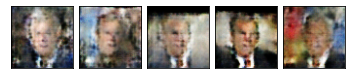

--- EPOCH 94/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: 0.2924596402136719
Generator loss:     4.479562450857723


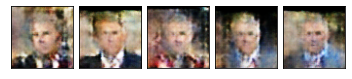

--- EPOCH 95/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
Discriminator loss: 0.30979322992703495
Generator loss:     5.245639758951524


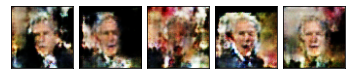

--- EPOCH 96/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.85it/s]
Discriminator loss: 0.2271782955264344
Generator loss:     4.716462668250589
Saved checkpoint.


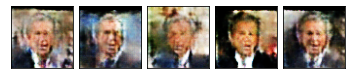

--- EPOCH 97/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.79it/s]
Discriminator loss: 0.3793213450733353
Generator loss:     4.86145933936624


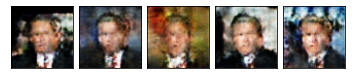

--- EPOCH 98/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: 0.3208407097879578
Generator loss:     4.776047201717601
Saved checkpoint.


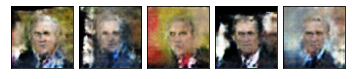

--- EPOCH 99/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: 0.5399544764967525
Generator loss:     4.740337231579949


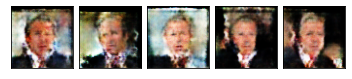

--- EPOCH 100/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.85it/s]
Discriminator loss: 0.2007404237109072
Generator loss:     4.675300626193776
Saved checkpoint.


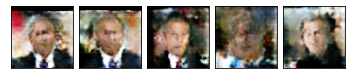

In [31]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint
torch.manual_seed(42)

num_epochs = 100
checkpoint_file_final_sn = 'checkpoints/gan_sn'


if os.path.isfile(f'{checkpoint_file_final_sn}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final_sn} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final_sn}.pt', map_location=device)

else:
    train_gan(num_epochs, checkpoint_file, sn=True, wasserstein=False)


## 2. Wasserstein GAN

--- EPOCH 1/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.19it/s]
Discriminator loss: -154.4038602495018
Generator loss:     118.42201094066395
Saved checkpoint.


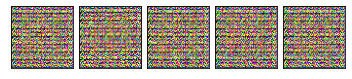

--- EPOCH 2/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -1379.7238715676701
Generator loss:     813.230474135455


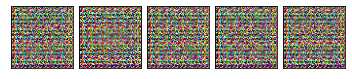

--- EPOCH 3/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.14it/s]
Discriminator loss: -4355.767319623162
Generator loss:     2316.712294634651


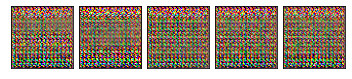

--- EPOCH 4/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.28it/s]
Discriminator loss: -9561.55778952206
Generator loss:     4921.863956227022


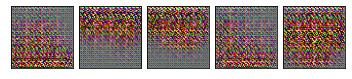

--- EPOCH 5/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: -15733.103860294117
Generator loss:     7653.13534007353


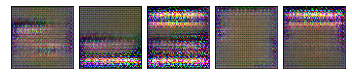

--- EPOCH 6/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -24759.690142463234
Generator loss:     12245.330365349264


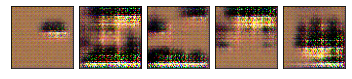

--- EPOCH 7/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -35058.650390625
Generator loss:     17692.10041360294


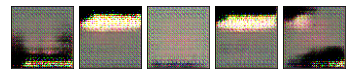

--- EPOCH 8/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.19it/s]
Discriminator loss: -36739.56341911765
Generator loss:     22646.575597426472


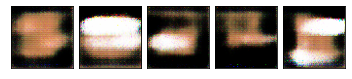

--- EPOCH 9/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.23it/s]
Discriminator loss: -40510.588005514706
Generator loss:     26151.728975183825


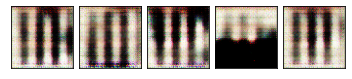

--- EPOCH 10/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.14it/s]
Discriminator loss: -48275.05629595588
Generator loss:     32397.533662683825


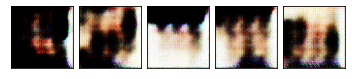

--- EPOCH 11/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.18it/s]
Discriminator loss: -55811.55399816176
Generator loss:     39320.59397977941


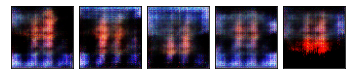

--- EPOCH 12/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.15it/s]
Discriminator loss: -55082.1015625
Generator loss:     41007.39131433824


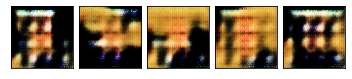

--- EPOCH 13/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: -55228.396943933825
Generator loss:     38401.25656307445
Saved checkpoint.


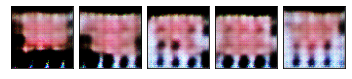

--- EPOCH 14/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -85259.47610294117
Generator loss:     57066.001838235294


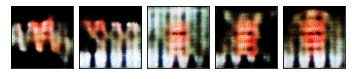

--- EPOCH 15/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -104709.15670955883
Generator loss:     70427.64797794117


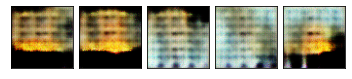

--- EPOCH 16/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -127297.52113970589
Generator loss:     79007.07421875


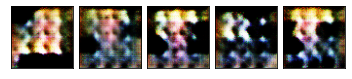

--- EPOCH 17/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.60it/s]
Discriminator loss: -163275.78998161765
Generator loss:     96353.36856617648


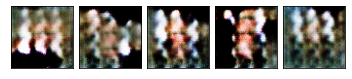

--- EPOCH 18/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -185438.0252757353
Generator loss:     117439.18290441176


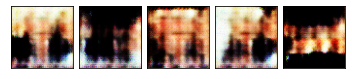

--- EPOCH 19/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.22it/s]
Discriminator loss: -211563.93474264705
Generator loss:     131571.59237132352


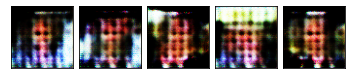

--- EPOCH 20/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -209741.03584558822
Generator loss:     148539.31525735295


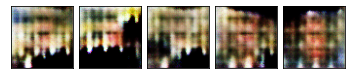

--- EPOCH 21/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -238565.51838235295
Generator loss:     162939.1387867647


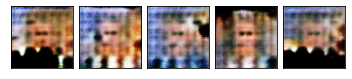

--- EPOCH 22/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -240133.3474264706
Generator loss:     164908.92738970587


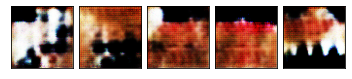

--- EPOCH 23/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -286343.23161764705
Generator loss:     191066.70220588235


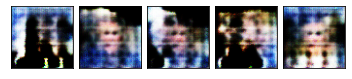

--- EPOCH 24/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.16it/s]
Discriminator loss: -283140.0932904412
Generator loss:     209984.1989889706


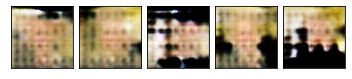

--- EPOCH 25/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: -362236.5073529412
Generator loss:     234976.9705882353


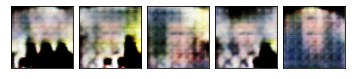

--- EPOCH 26/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.14it/s]
Discriminator loss: -344034.74540441175
Generator loss:     247592.91911764705


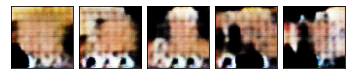

--- EPOCH 27/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.18it/s]
Discriminator loss: -377065.4604779412
Generator loss:     269600.60294117645


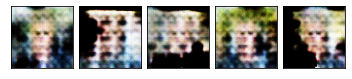

--- EPOCH 28/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -343471.3419117647
Generator loss:     261320.02849264705


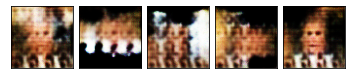

--- EPOCH 29/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -518347.1213235294
Generator loss:     336475.0330882353


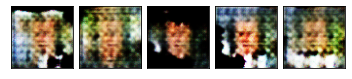

--- EPOCH 30/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.19it/s]
Discriminator loss: -428181.26102941175
Generator loss:     315990.7794117647


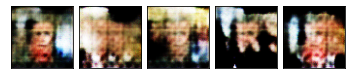

--- EPOCH 31/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.13it/s]
Discriminator loss: -500873.26838235295
Generator loss:     353927.39522058825


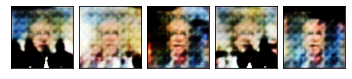

--- EPOCH 32/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.15it/s]
Discriminator loss: -485648.20036764705
Generator loss:     376785.1948529412


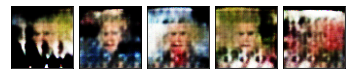

--- EPOCH 33/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: -520229.67830882355
Generator loss:     381889.5955882353


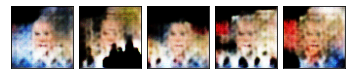

--- EPOCH 34/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.18it/s]
Discriminator loss: -522018.44669117645
Generator loss:     435944.96231617645


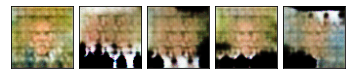

--- EPOCH 35/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -648541.8786764706
Generator loss:     424471.9802389706
Saved checkpoint.


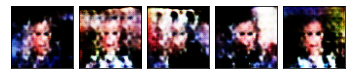

--- EPOCH 36/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: -625383.0220588235
Generator loss:     487995.3511029412


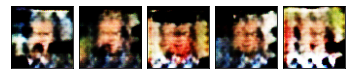

--- EPOCH 37/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -685168.3584558824
Generator loss:     493670.5974264706


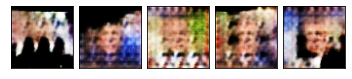

--- EPOCH 38/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -802157.8014705882
Generator loss:     553362.5147058824


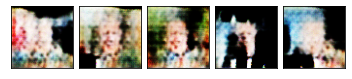

--- EPOCH 39/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: -867783.2426470588
Generator loss:     602452.5128676471


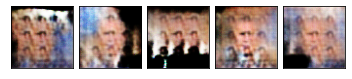

--- EPOCH 40/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.63it/s]
Discriminator loss: -867714.4595588235
Generator loss:     605352.5652573529


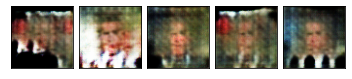

--- EPOCH 41/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: -889043.8014705882
Generator loss:     654376.7757352941


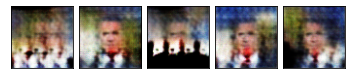

--- EPOCH 42/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.19it/s]
Discriminator loss: -1065499.2794117648
Generator loss:     707368.8143382353


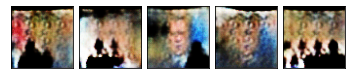

--- EPOCH 43/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: -1011434.5183823529
Generator loss:     691621.25


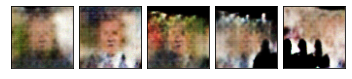

--- EPOCH 44/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.23it/s]
Discriminator loss: -1039965.4448529412
Generator loss:     707545.5050551471


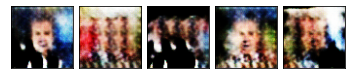

--- EPOCH 45/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: -1262105.125
Generator loss:     816945.3602941176


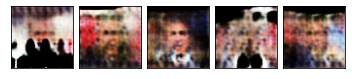

--- EPOCH 46/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.24it/s]
Discriminator loss: -1165955.143382353
Generator loss:     890965.9816176471


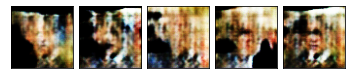

--- EPOCH 47/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -1308897.75
Generator loss:     883184.3198529412
Saved checkpoint.


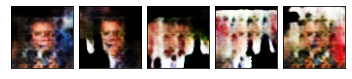

--- EPOCH 48/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.18it/s]
Discriminator loss: -1665618.2242647058
Generator loss:     1046893.8566176471


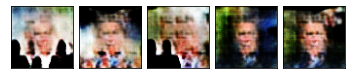

--- EPOCH 49/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -1432091.8161764706
Generator loss:     1011144.7610294118


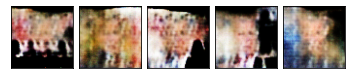

--- EPOCH 50/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -1258408.3235294118
Generator loss:     879101.3216911765


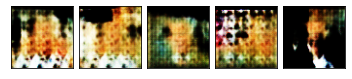

--- EPOCH 51/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: -2000240.0735294118
Generator loss:     1231852.1470588236


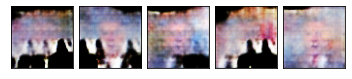

--- EPOCH 52/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -1566975.0330882352
Generator loss:     1120196.8897058824


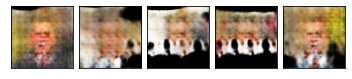

--- EPOCH 53/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -1820003.6470588236
Generator loss:     1183521.0367647058


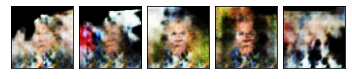

--- EPOCH 54/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.17it/s]
Discriminator loss: -1848916.1323529412
Generator loss:     1244641.799632353


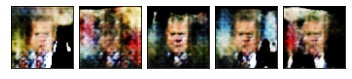

--- EPOCH 55/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: -1943777.8970588236
Generator loss:     1367389.5514705882


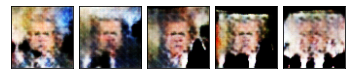

--- EPOCH 56/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.22it/s]
Discriminator loss: -1938187.0882352942
Generator loss:     1359754.7095588236


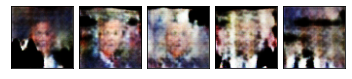

--- EPOCH 57/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -2155348.904411765
Generator loss:     1479180.1397058824


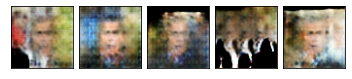

--- EPOCH 58/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.21it/s]
Discriminator loss: -2034125.6911764706
Generator loss:     1523266.2830882352


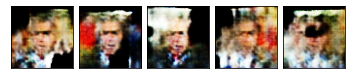

--- EPOCH 59/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.15it/s]
Discriminator loss: -2349423.705882353
Generator loss:     1535788.669117647


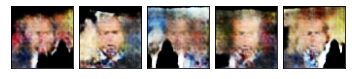

--- EPOCH 60/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -2466592.617647059
Generator loss:     1608974.8970588236


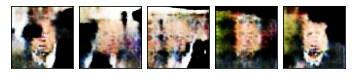

--- EPOCH 61/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: -2461842.0514705884
Generator loss:     1726973.5551470588


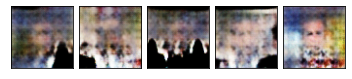

--- EPOCH 62/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.13it/s]
Discriminator loss: -2664794.6102941176
Generator loss:     1815599.4485294118


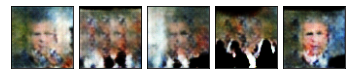

--- EPOCH 63/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.16it/s]
Discriminator loss: -2589994.580882353
Generator loss:     1802512.4889705882


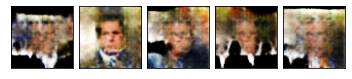

--- EPOCH 64/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.53it/s]
Discriminator loss: -2612370.7279411764
Generator loss:     1848284.0955882352


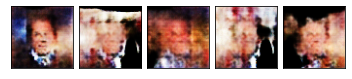

--- EPOCH 65/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.22it/s]
Discriminator loss: -2832455.0735294116
Generator loss:     1946963.2352941176


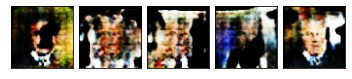

--- EPOCH 66/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: -2709999.6764705884
Generator loss:     1943082.3602941176


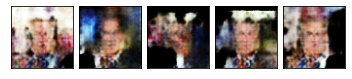

--- EPOCH 67/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -3118826.8970588236
Generator loss:     2046553.4632352942


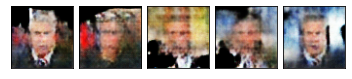

--- EPOCH 68/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.19it/s]
Discriminator loss: -2909332.6397058824
Generator loss:     2040262.7720588236


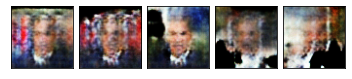

--- EPOCH 69/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.15it/s]
Discriminator loss: -3168595.205882353
Generator loss:     2248816.882352941


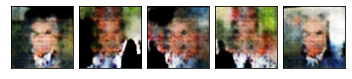

--- EPOCH 70/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.21it/s]
Discriminator loss: -3084875.911764706
Generator loss:     2175461.7610294116


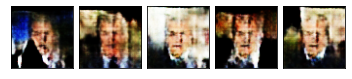

--- EPOCH 71/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.14it/s]
Discriminator loss: -3420644.279411765
Generator loss:     2360731.382352941


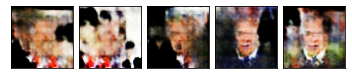

--- EPOCH 72/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -3664343.9852941176
Generator loss:     2413190.7647058824


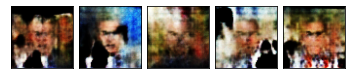

--- EPOCH 73/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -3450763.117647059
Generator loss:     2452364.9852941176


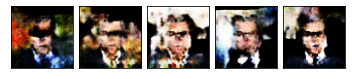

--- EPOCH 74/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: -3398256.411764706
Generator loss:     2528472.8970588236


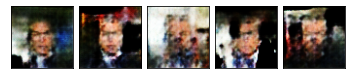

--- EPOCH 75/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -3505813.5735294116
Generator loss:     2584777.5147058824


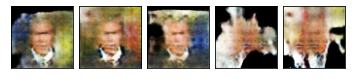

--- EPOCH 76/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: -3462365.882352941
Generator loss:     2623537.75


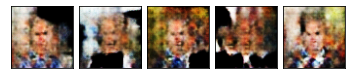

--- EPOCH 77/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -3864892.588235294
Generator loss:     2684096.4411764704


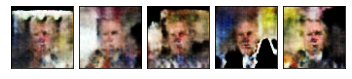

--- EPOCH 78/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.23it/s]
Discriminator loss: -3787699.6470588236
Generator loss:     2739422.117647059


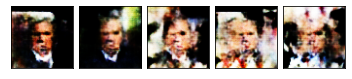

--- EPOCH 79/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -4213150.926470588
Generator loss:     2804751.2352941176


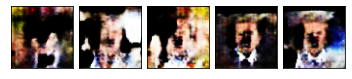

--- EPOCH 80/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -3969163.338235294
Generator loss:     2741369.492647059


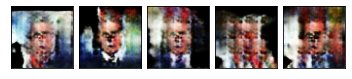

--- EPOCH 81/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.13it/s]
Discriminator loss: -4287163.147058823
Generator loss:     3007370.7279411764


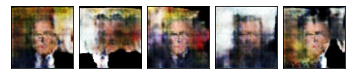

--- EPOCH 82/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.52it/s]
Discriminator loss: -4066735.529411765
Generator loss:     2812287.8970588236


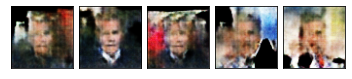

--- EPOCH 83/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -4302785.30882353
Generator loss:     3086057.75


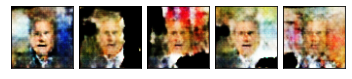

--- EPOCH 84/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.15it/s]
Discriminator loss: -4287071.985294118
Generator loss:     3108674.1029411764


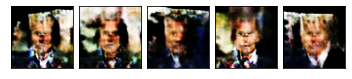

--- EPOCH 85/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -4693932.176470588
Generator loss:     3243002.8235294116


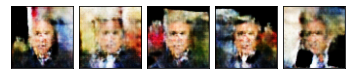

--- EPOCH 86/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.14it/s]
Discriminator loss: -4651981.205882353
Generator loss:     3397618.7352941176


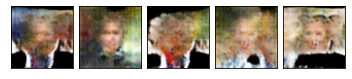

--- EPOCH 87/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.73it/s]
Discriminator loss: -4962892.05882353
Generator loss:     3444163.5147058824


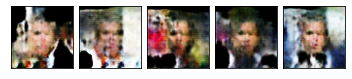

--- EPOCH 88/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.09it/s]
Discriminator loss: -4904397.117647059
Generator loss:     3473725.661764706


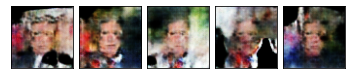

--- EPOCH 89/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.16it/s]
Discriminator loss: -5089908.794117647
Generator loss:     3628821.4852941176


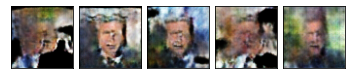

--- EPOCH 90/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -5164895.102941177
Generator loss:     3490025.9852941176
Saved checkpoint.


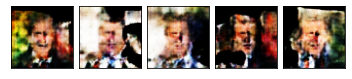

--- EPOCH 91/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.70it/s]
Discriminator loss: -4801049.044117647
Generator loss:     3409683.3161764704


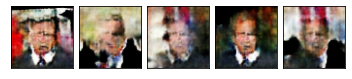

--- EPOCH 92/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.16it/s]
Discriminator loss: -5086754.588235294
Generator loss:     3750462.0147058824


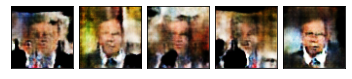

--- EPOCH 93/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: -5627685.794117647
Generator loss:     4015482.632352941


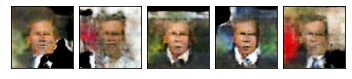

--- EPOCH 94/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: -5733191.55882353
Generator loss:     3922239.9852941176
Saved checkpoint.


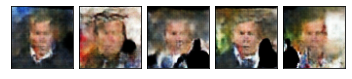

--- EPOCH 95/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.21it/s]
Discriminator loss: -5880383.882352941
Generator loss:     4134336.470588235


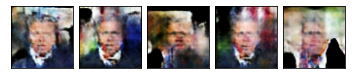

--- EPOCH 96/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: -5651950.647058823
Generator loss:     3932456.0


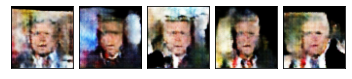

--- EPOCH 97/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: -5610808.55882353
Generator loss:     4126112.0147058824


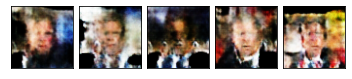

--- EPOCH 98/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -5607329.705882353
Generator loss:     4115852.0661764704


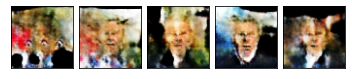

--- EPOCH 99/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -6046675.5
Generator loss:     4246872.367647059


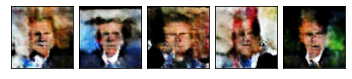

--- EPOCH 100/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -6060888.323529412
Generator loss:     4339861.169117647


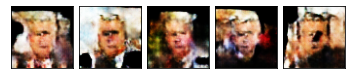

In [27]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint
torch.manual_seed(42)

num_epochs = 100
checkpoint_file_final_wasserstein = 'checkpoints/gan_wasserstein'


if os.path.isfile(f'{checkpoint_file_final_wasserstein}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final_wasserstein} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final_wasserstein}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final_wasserstein

else:
    train_gan(num_epochs, checkpoint_file, sn=False, wasserstein=True)


## 3. SN GAN + Wasserstein GAN

--- EPOCH 1/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: -133.6074657720678
Generator loss:     111.0103200042949
Saved checkpoint.


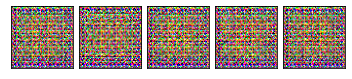

--- EPOCH 2/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -1191.1884783576515
Generator loss:     745.6054005342371


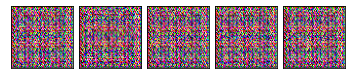

--- EPOCH 3/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -4133.998764935662
Generator loss:     2250.464154411765


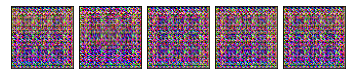

--- EPOCH 4/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
Discriminator loss: -9150.613712086397
Generator loss:     4951.626622817095


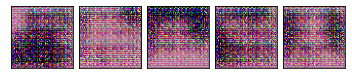

--- EPOCH 5/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -11620.053768382353
Generator loss:     7252.035759420956


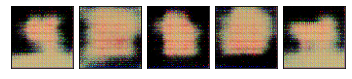

--- EPOCH 6/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -14028.656996783087
Generator loss:     9997.730009191177


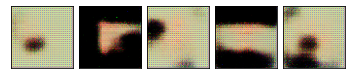

--- EPOCH 7/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.85it/s]
Discriminator loss: -23542.69565716912
Generator loss:     14797.91463694853


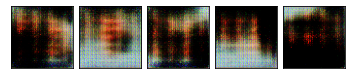

--- EPOCH 8/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -29517.23012408088
Generator loss:     20495.856387867647


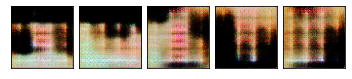

--- EPOCH 9/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: -43189.51539522059
Generator loss:     27185.279526654413


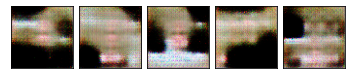

--- EPOCH 10/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.84it/s]
Discriminator loss: -55596.17095588235
Generator loss:     34676.60604319853


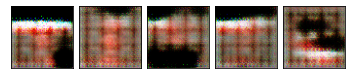

--- EPOCH 11/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: -69913.13258272059
Generator loss:     45212.47748161765


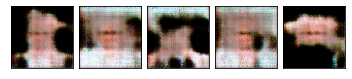

--- EPOCH 12/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -88628.50367647059
Generator loss:     55363.61741727941


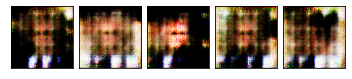

--- EPOCH 13/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: -102304.58363970589
Generator loss:     66455.02964154411


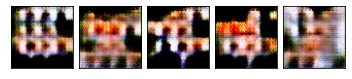

--- EPOCH 14/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -130935.29595588235
Generator loss:     76197.69209558824


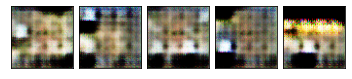

--- EPOCH 15/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: -169000.7169117647
Generator loss:     94803.7752757353


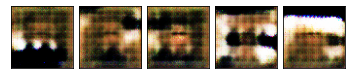

--- EPOCH 16/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.09it/s]
Discriminator loss: -189135.30238970587
Generator loss:     112125.07674632352


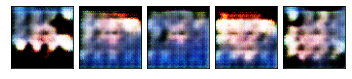

--- EPOCH 17/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: -195998.12408088235
Generator loss:     129036.37178308824


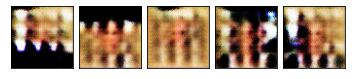

--- EPOCH 18/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -258887.79044117648
Generator loss:     150816.29044117648


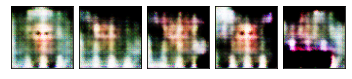

--- EPOCH 19/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.93it/s]
Discriminator loss: -255486.88005514705
Generator loss:     168146.17830882352


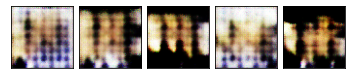

--- EPOCH 20/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -270137.9825367647
Generator loss:     186267.86764705883


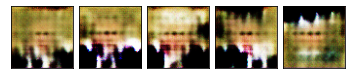

--- EPOCH 21/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.58it/s]
Discriminator loss: -348307.5569852941
Generator loss:     212753.04044117648


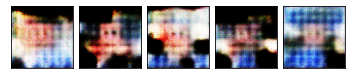

--- EPOCH 22/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: -380789.3676470588
Generator loss:     229504.0505514706


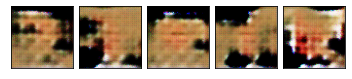

--- EPOCH 23/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -461564.8088235294
Generator loss:     269639.88786764705


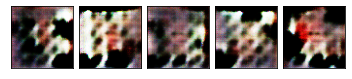

--- EPOCH 24/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: -434167.9705882353
Generator loss:     286136.8731617647


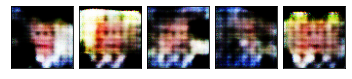

--- EPOCH 25/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: -498668.77022058825
Generator loss:     313609.9613970588


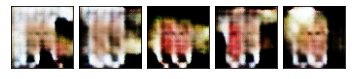

--- EPOCH 26/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -564368.6323529412
Generator loss:     348848.6911764706


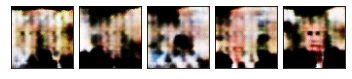

--- EPOCH 27/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.84it/s]
Discriminator loss: -501549.38970588235
Generator loss:     363280.5680147059


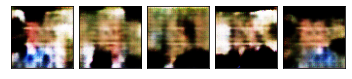

--- EPOCH 28/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -716261.9540441176
Generator loss:     403893.93841911765


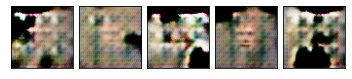

--- EPOCH 29/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.12it/s]
Discriminator loss: -780030.1066176471
Generator loss:     447460.0330882353


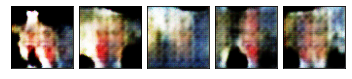

--- EPOCH 30/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.85it/s]
Discriminator loss: -636403.3235294118
Generator loss:     480954.8676470588


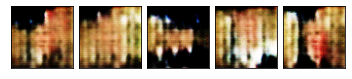

--- EPOCH 31/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -818638.5900735294
Generator loss:     530313.2941176471


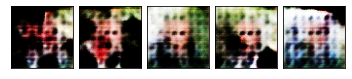

--- EPOCH 32/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -736386.1764705882
Generator loss:     533416.3823529412


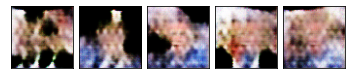

--- EPOCH 33/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: -990362.1801470588
Generator loss:     591208.7196691176


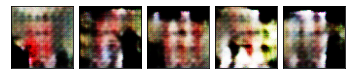

--- EPOCH 34/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -1251550.0220588236
Generator loss:     677409.3051470588


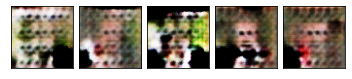

--- EPOCH 35/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: -1198944.4779411764
Generator loss:     702117.2941176471


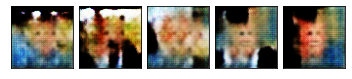

--- EPOCH 36/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: -15792.246323529413
Generator loss:     727503.1801470588


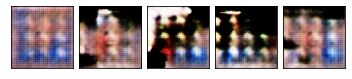

--- EPOCH 37/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.96it/s]
Discriminator loss: -305818.10845588235
Generator loss:     610448.6286764706
Saved checkpoint.


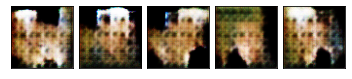

--- EPOCH 38/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -973340.3511029412
Generator loss:     699551.1838235294


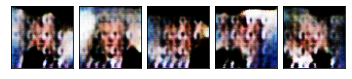

--- EPOCH 39/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -1087312.6654411764
Generator loss:     798200.4007352941


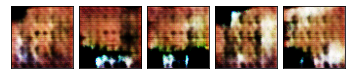

--- EPOCH 40/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.03it/s]
Discriminator loss: -1109796.3823529412
Generator loss:     788798.9246323529
Saved checkpoint.


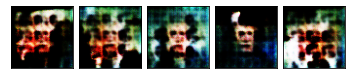

--- EPOCH 41/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: -1263374.4227941176
Generator loss:     781398.1011029412
Saved checkpoint.


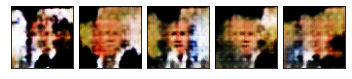

--- EPOCH 42/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.78it/s]
Discriminator loss: -1059823.012867647
Generator loss:     597142.6259191176


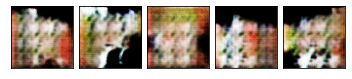

--- EPOCH 43/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -1253962.8786764706
Generator loss:     865777.4273897059


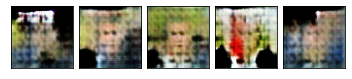

--- EPOCH 44/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.63it/s]
Discriminator loss: -1217097.6507352942
Generator loss:     910234.9761029412


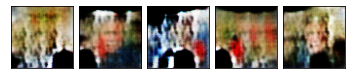

--- EPOCH 45/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -1237938.4301470588
Generator loss:     939805.1433823529


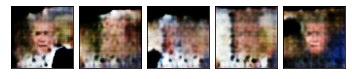

--- EPOCH 46/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -1517168.4338235294
Generator loss:     1015931.5036764706


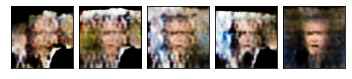

--- EPOCH 47/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -1637234.7794117648
Generator loss:     1095943.1937040442


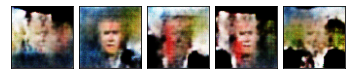

--- EPOCH 48/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -1582208.3639705882
Generator loss:     1115902.4944852942


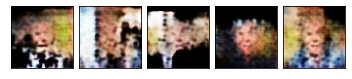

--- EPOCH 49/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.83it/s]
Discriminator loss: -1595438.7867647058
Generator loss:     1085726.5165441176
Saved checkpoint.


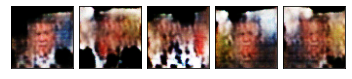

--- EPOCH 50/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -2336895.966911765
Generator loss:     1384976.4044117648


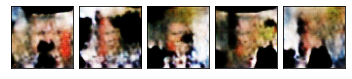

--- EPOCH 51/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -1677940.9044117648
Generator loss:     1225181.8235294118


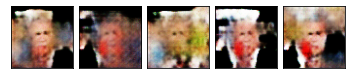

--- EPOCH 52/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.87it/s]
Discriminator loss: -1812176.8786764706
Generator loss:     1297542.5955882352


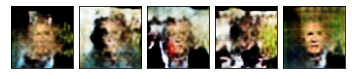

--- EPOCH 53/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.95it/s]
Discriminator loss: -2217322.492647059
Generator loss:     1453907.2573529412


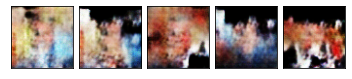

--- EPOCH 54/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -1763416.9522058824
Generator loss:     1236389.3014705882


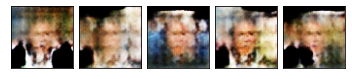

--- EPOCH 55/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.08it/s]
Discriminator loss: -2268399.088235294
Generator loss:     1528826.1213235294


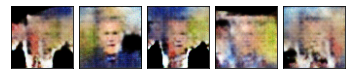

--- EPOCH 56/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -2083811.6580882352
Generator loss:     1448216.0404411764


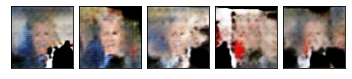

--- EPOCH 57/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.11it/s]
Discriminator loss: -2106158.8970588236
Generator loss:     1499525.4669117648


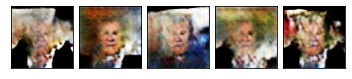

--- EPOCH 58/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: -2543021.338235294
Generator loss:     1677302.9705882352


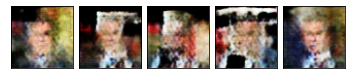

--- EPOCH 59/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
Discriminator loss: -2254517.5735294116
Generator loss:     1433825.940257353


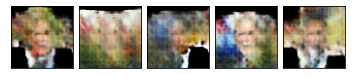

--- EPOCH 60/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.10it/s]
Discriminator loss: -2348460.8235294116
Generator loss:     1679466.7982536764


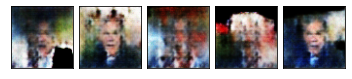

--- EPOCH 61/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -2768705.0220588236
Generator loss:     1803033.725413603


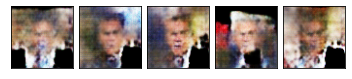

--- EPOCH 62/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.07it/s]
Discriminator loss: -2580324.5588235296
Generator loss:     1832620.9852941176


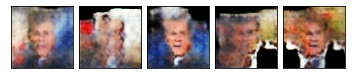

--- EPOCH 63/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.02it/s]
Discriminator loss: -3007783.367647059
Generator loss:     2001408.2794117648


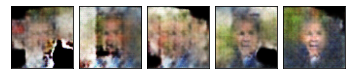

--- EPOCH 64/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.80it/s]
Discriminator loss: -2767701.5514705884
Generator loss:     1914050.6617647058


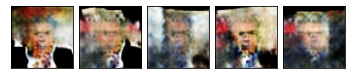

--- EPOCH 65/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -3000087.4411764704
Generator loss:     2061664.205882353


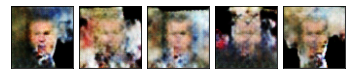

--- EPOCH 66/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -3114454.0588235296
Generator loss:     2188943.0588235296


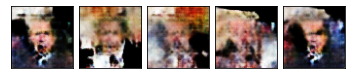

--- EPOCH 67/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.54it/s]
Discriminator loss: -3149242.661764706
Generator loss:     2223169.279411765


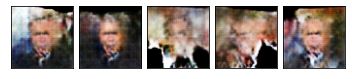

--- EPOCH 68/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.98it/s]
Discriminator loss: -3371532.029411765
Generator loss:     2325531.367647059


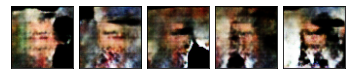

--- EPOCH 69/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -3472957.6029411764
Generator loss:     2365253.3088235296


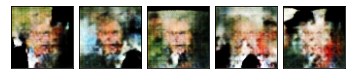

--- EPOCH 70/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -3747141.720588235
Generator loss:     2520394.588235294


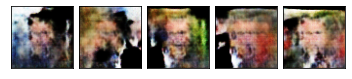

--- EPOCH 71/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -3571602.8235294116
Generator loss:     2509637.7647058824


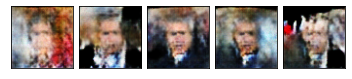

--- EPOCH 72/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -3532993.9264705884
Generator loss:     2484481.213235294


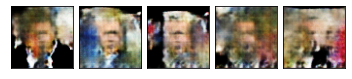

--- EPOCH 73/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.04it/s]
Discriminator loss: -3634223.6029411764
Generator loss:     2626732.492647059


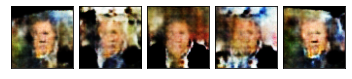

--- EPOCH 74/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.81it/s]
Discriminator loss: -3944678.1029411764
Generator loss:     2721560.6911764704


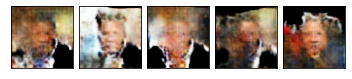

--- EPOCH 75/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.67it/s]
Discriminator loss: -3468866.632352941
Generator loss:     2755040.25


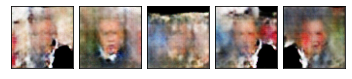

--- EPOCH 76/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.83it/s]
Discriminator loss: -4176177.1470588236
Generator loss:     2848885.4264705884


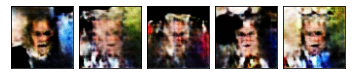

--- EPOCH 77/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: -4106053.720588235
Generator loss:     2909639.095588235


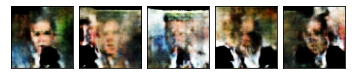

--- EPOCH 78/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: -4279496.544117647
Generator loss:     3077425.1029411764


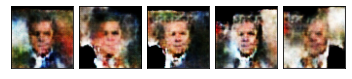

--- EPOCH 79/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: -4256750.676470588
Generator loss:     3060408.1029411764


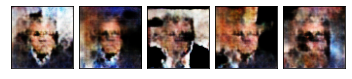

--- EPOCH 80/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.84it/s]
Discriminator loss: -4695494.073529412
Generator loss:     3233393.632352941


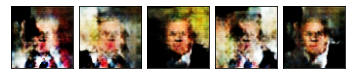

--- EPOCH 81/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -4728817.823529412
Generator loss:     3323287.8529411764


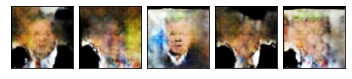

--- EPOCH 82/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.80it/s]
Discriminator loss: -4430406.823529412
Generator loss:     3306836.279411765


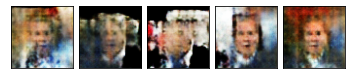

--- EPOCH 83/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.05it/s]
Discriminator loss: -4913079.897058823
Generator loss:     3389460.3529411764


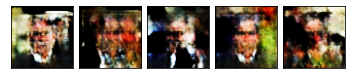

--- EPOCH 84/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: -4939657.161764706
Generator loss:     3516986.382352941


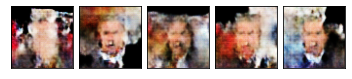

--- EPOCH 85/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.06it/s]
Discriminator loss: -4841032.926470588
Generator loss:     3496261.544117647


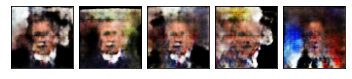

--- EPOCH 86/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.94it/s]
Discriminator loss: -5038399.147058823
Generator loss:     3693866.2352941176


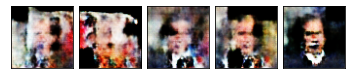

--- EPOCH 87/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.97it/s]
Discriminator loss: -4903934.367647059
Generator loss:     3571633.8088235296


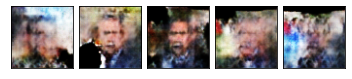

--- EPOCH 88/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.83it/s]
Discriminator loss: -5119132.088235294
Generator loss:     3872393.7352941176


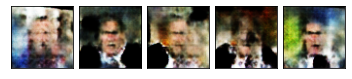

--- EPOCH 89/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.00it/s]
Discriminator loss: -5154177.25
Generator loss:     3916884.25


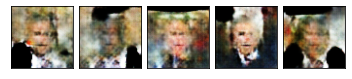

--- EPOCH 90/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.53it/s]
Discriminator loss: -5375097.764705882
Generator loss:     3899919.838235294
Saved checkpoint.


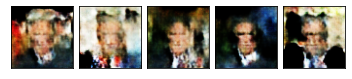

--- EPOCH 91/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.90it/s]
Discriminator loss: -5476802.970588235
Generator loss:     4017171.6764705884


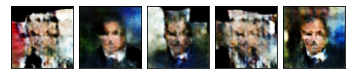

--- EPOCH 92/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -5719037.382352941
Generator loss:     4111696.6764705884


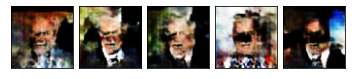

--- EPOCH 93/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.73it/s]
Discriminator loss: -5663861.117647059
Generator loss:     4139053.205882353


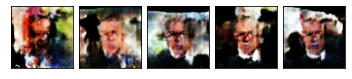

--- EPOCH 94/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.91it/s]
Discriminator loss: -5653296.05882353
Generator loss:     4258613.014705882


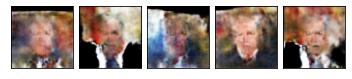

--- EPOCH 95/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.57it/s]
Discriminator loss: -5901517.470588235
Generator loss:     4291072.80882353


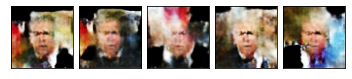

--- EPOCH 96/100 ---
100%|██████████| 17/17 [00:02<00:00,  7.01it/s]
Discriminator loss: -6078018.147058823
Generator loss:     4424120.352941177


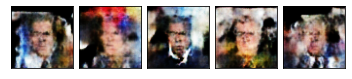

--- EPOCH 97/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.64it/s]
Discriminator loss: -6152079.352941177
Generator loss:     4364454.485294118
Saved checkpoint.


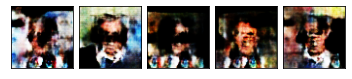

--- EPOCH 98/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.89it/s]
Discriminator loss: -6706391.764705882
Generator loss:     4725241.705882353


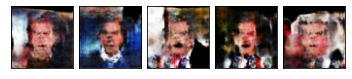

--- EPOCH 99/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.92it/s]
Discriminator loss: -6479737.647058823
Generator loss:     4611725.852941177


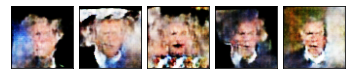

--- EPOCH 100/100 ---
100%|██████████| 17/17 [00:02<00:00,  6.99it/s]
Discriminator loss: -6698678.147058823
Generator loss:     4924928.588235294


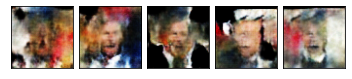

In [25]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint
torch.manual_seed(42)

num_epochs = 100
checkpoint_file_final_sn_wasserstein = 'checkpoints/gan_sn_wasserstein'


if os.path.isfile(f'{checkpoint_file_final_sn_wasserstein}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final_sn_wasserstein} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final_sn_wasserstein}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final_sn_wasserstein

else:
    train_gan(num_epochs, checkpoint_file, sn=True, wasserstein=True)
